In [1]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import pandas as pd
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
from matplotlib.colors import LogNorm
from astropy.visualization import ImageNormalize, LinearStretch, AsinhStretch, SqrtStretch 
import matplotlib.lines as lines
import matplotlib.patches as mpatches
from matplotlib.collections import PatchCollection
import matplotlib.image as mpimg

%matplotlib inline

In [ ]:
#         optical band

In [3]:
dirname1 = '/Users/orion/phd_research/CSS2/galfit/optical/'
dirname2 = '/Users/orion/phd_research/CSS2/ap_phot_new/plots/'

sources = {'0258+35': 'f621m', '1014+392': 'f845m', '1025+390': 'f763m',  '1037+30': 'f621m', '1128+455': 'f763m', 
        '1201+394': 'f845m', '1203+645': 'f763m', '1221-423': 'f689m', '1445+410': 'f689m'}

name = []
gal_mod_file = []
source = np.zeros(9, dtype=object)    #initializes an array of non-specfic type
i=0

for value in sources:
    print(value, sources[value])
    name.append(value)
    gal_mod_file.append(dirname1+value+'/'+value+'_finalfit.fits')
    #source[i] = fits.open(gal_mod_file[i-1])
    source[i] = fits.open(gal_mod_file[i])
    i=i+1

print(gal_mod_file)

0258+35 f621m
1014+392 f845m
1025+390 f763m
1037+30 f621m
1128+455 f763m
1201+394 f845m
1203+645 f763m
1221-423 f689m
1445+410 f689m
['/Users/orion/phd_research/CSS2/galfit/optical/0258+35/0258+35_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/optical/1014+392/1014+392_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/optical/1025+390/1025+390_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/optical/1037+30/1037+30_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/optical/1128+455/1128+455_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/optical/1201+394/1201+394_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/optical/1203+645/1203+645_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/optical/1221-423/1221-423_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/optical/1445+410/1445+410_finalfit.fits']


In [2]:

def format_axis_galfit(ax):
        
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_xticks([])
    ax.set_yticks([])
    
    
def format_axis(ax):
       
    #for Ellipsect figure as imshow
    #ax.tick_params(labelbottom=False, labeltop=False, labelleft=False, labelright=False,
    #                 bottom=False, top=False, left=False, right=False)
    ax.axis('off')

    
def plot(s):
    #plt.rcParams['font.family'] = 'serif'
    fig = plt.figure(figsize=(20,12))
    
    #dimensions [left, bottom, width, height] in fractions of figure width and height
    ax1 = fig.add_axes([0.05, 0.2, 0.25, 0.45])
    ax1.set_title(s, fontsize=28, loc = 'left')
    ax2 = fig.add_axes([0.31, 0.44, 0.13, 0.21])
    ax3 = fig.add_axes([0.31, 0.2, 0.13, 0.22])

    ax4 = fig.add_axes([0.41, 0.21, 0.35, 0.43]) 
    ax5 = fig.add_axes([0.65, 0.20, 0.30, 0.46])    
    
    axis_list = fig.get_axes()      #get_axes() produces a list
        
    for i in range(3):
        format_axis_galfit(axis_list[i])
    
    format_axis(fig.get_axes()[3])
    format_axis(fig.get_axes()[4])
    
    return axis_list


def plot_isophote_data(s, axis_list):

    img = mpimg.imread(dirname1+s+'/ellipsect_plot.png')
    axis_list[3].imshow(img)#, extent=(0, img.shape[1], 0,img.shape[0]+200))
    axis_list[3].set_aspect(1.3)
 
    img = mpimg.imread(dirname2+s+'_fit.png')
    axis_list[4].imshow(img)#, extent=(0, img.shape[1], 0,img.shape[0]+200))
    axis_list[4].set_aspect(1.0)


Filename: /Users/orion/phd_research/CSS2/galfit/optical/0258+35/0258+35_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (990, 730)   float32   
  1                1 ImageHDU       407   (990, 730)   float32   
  2                1 ImageHDU        61   (990, 730)   float32   
  3                1 ImageHDU         6   (990, 730)   float32   


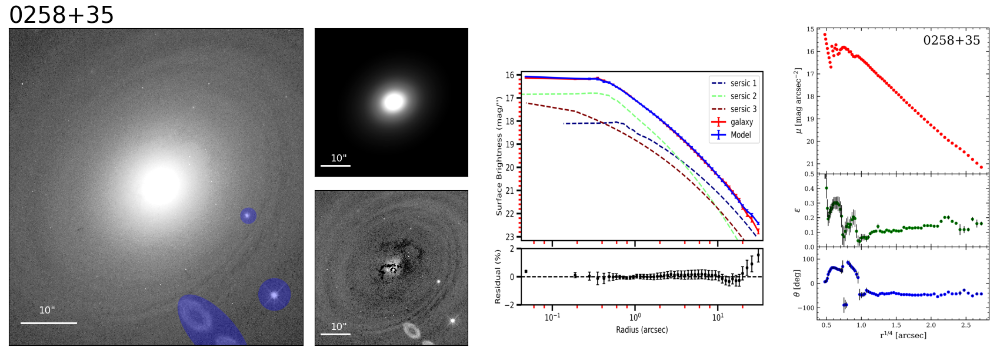

In [6]:
# 0258+35

    
def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
    
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[0].text(0.1,0.1,'10"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[1].text(0.1,0.1,'10"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    axis_list[2].text(0.1,0.1,'10"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    plot_masked_regions(axis_list)
    
    
    
def plot_masked_regions(axis_list):
    
    # x, y in 'Image' co-ordinates
    axis_list[0].plot([233,333], [121, 121], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([233,333], [121, 121], lw=2, color='w')
    axis_list[2].plot([233,333], [121, 121], lw=2, color='w')
    
    patches = []
    
    ellipse = mpatches.Ellipse((587,101), 180, 80, angle=132)
    #axis.add_patch(ellipse)
    patches.append(ellipse)
    
    circle1 = mpatches.Circle((698,173), 30)
    patches.append(circle1)
    
    circle2 = mpatches.Circle((650,317), 15)
    patches.append(circle2)
    
    collection = PatchCollection(patches, facecolor='blue', alpha=0.3)
    axis_list[0].add_collection(collection)


norm = list(range(3))
#norm[0] = ImageNormalize(stretch=LinearStretch(), vmin=-200, vmax=9000)   --> core
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=-60, vmax=1300)
norm[1] = ImageNormalize(stretch=LinearStretch(), vmin=100, vmax=1500)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-50, vmax=500)

x1 = 210 
x2 = 750
y1 = 80
y2 = 660

axes = plot(name[0])
plot_galfit_images(source[0], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[0], axes)


plt.savefig(dirname1+name[0]+'_fit.pdf', dpi=1000, facecolor='w', bbox_inches='tight') 


Filename: /Users/orion/phd_research/CSS2/galfit/optical/1014+392/1014+392_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (106, 87)   float32   
  1                1 ImageHDU       460   (106, 87)   float32   
  2                1 ImageHDU        43   (106, 87)   float32   
  3                1 ImageHDU         6   (106, 87)   float32   


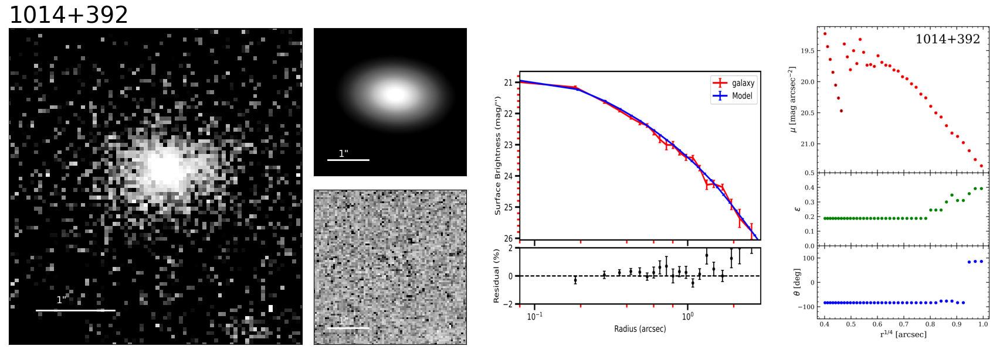

In [8]:
# 1014+392


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[0].text(0.16,0.13,'1"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[1].text(0.16,0.13,'1"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    axis_list[2].text(0.16,0.13,'1"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    plot_masked_regions(axis_list)
    
    
def plot_masked_regions(axis_list):
    
    # x, y in 'Image' co-ordinates
    axis_list[0].plot([22,42], [10,10], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([22,42], [10,10], lw=2, color='w')
    axis_list[2].plot([22,42], [10,10], lw=2, color='w')
    

norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=20, vmax=100) 
norm[1] = ImageNormalize(stretch=AsinhStretch(), vmin=10, vmax=100)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-30, vmax=100)

x1 = 15
y1 = 1
x2 = 90
y2 = 85

axes = plot(name[1])
plot_galfit_images(source[1], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[1], axes)

plt.savefig(dirname1+name[1]+'_fit.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/optical/1025+390/1025+390_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (190, 171)   float32   
  1                1 ImageHDU       466   (190, 171)   float32   
  2                1 ImageHDU        57   (190, 171)   float32   
  3                1 ImageHDU         6   (190, 171)   float32   


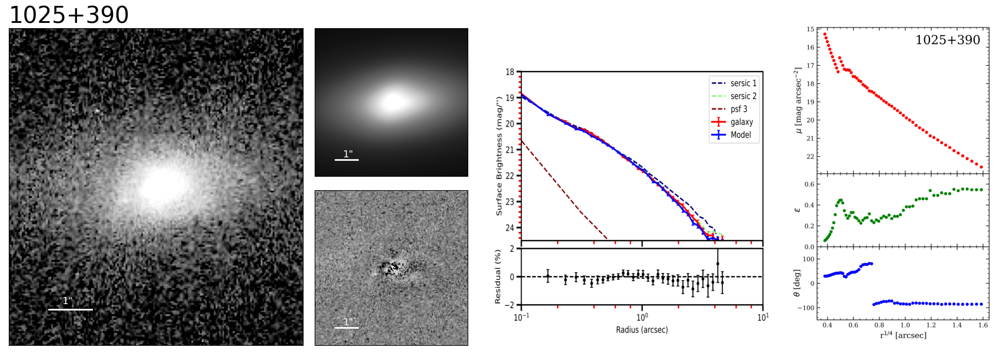

In [10]:
# 1025+390


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[0].text(0.18,0.13,'1"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[1].text(0.18,0.13,'1"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    axis_list[2].text(0.18,0.13,'1"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    plot_masked_regions(axis_list)
    
    
def plot_masked_regions(axis_list):
    
    # x, y in 'Image' co-ordinates
    axis_list[0].plot([33,58], [20,20], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([33,58], [20,20], lw=2, color='w')
    axis_list[2].plot([33,58], [20,20], lw=2, color='w')
    

norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=147) 
norm[1] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=147)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-25, vmax=125)


x1 = 10
y1 = 1
x2 = 180
y2 = 170

axes = plot(name[2])
plot_galfit_images(source[2], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[2], axes)

plt.savefig(dirname1+name[2]+'_fit.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/optical/1037+30/1037+30_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (256, 195)   float32   
  1                1 ImageHDU       373   (256, 195)   float32   
  2                1 ImageHDU        57   (256, 195)   float32   
  3                1 ImageHDU         6   (256, 195)   float32   


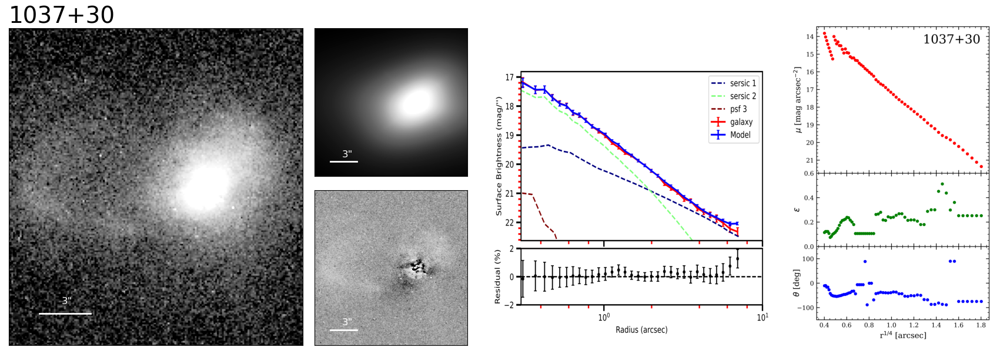

In [11]:
# 1037+30


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[0].text(0.18,0.13,'3"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[1].text(0.18,0.13,'3"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    axis_list[2].text(0.18,0.13,'3"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    plot_masked_regions(axis_list)
    
    
def plot_masked_regions(axis_list):
    
    # x, y in 'Image' co-ordinates
    axis_list[0].plot([43,73], [22,22], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([43,73], [22,22], lw=2, color='w')
    axis_list[2].plot([43,73], [22,22], lw=2, color='w')
    

norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=-10, vmax=400) 
norm[1] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=310)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-110, vmax=360)


x1 = 25
y1 = 3
x2 = 198
y2 = 192

axes = plot(name[3])
plot_galfit_images(source[3], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[3], axes)

plt.savefig(dirname1+name[3]+'_fit.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/optical/1128+455/1128+455_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (386, 336)   float32   
  1                1 ImageHDU       466   (386, 336)   float32   
  2                1 ImageHDU        43   (386, 336)   float32   
  3                1 ImageHDU         6   (386, 336)   float32   


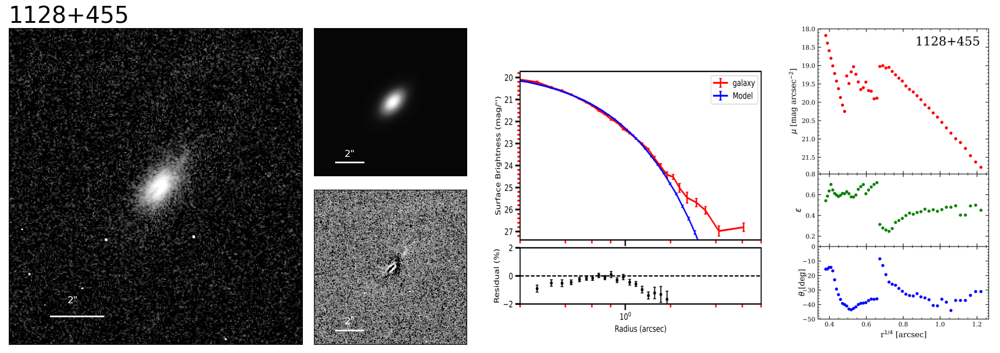

In [12]:
# 1128+455


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[0].text(0.2,0.13,'2"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[1].text(0.2,0.13,'2"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    axis_list[2].text(0.2,0.13,'2"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    plot_masked_regions(axis_list)
    
    
def plot_masked_regions(axis_list):
    
    # x, y in 'Image' co-ordinates
    axis_list[0].plot([98,150], [32,32], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([98,150], [32,32], lw=2, color='w')
    axis_list[2].plot([98,150], [32,32], lw=2, color='w')
    

norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=200) 
norm[1] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=200)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-10, vmax=60)


x1 = 57
y1 = 3
x2 = 345
y2 = 325

axes = plot(name[4])
plot_galfit_images(source[4], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[4], axes)

plt.savefig(dirname1+name[4]+'_fit.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/optical/1201+394/1201+394_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (190, 190)   float32   
  1                1 ImageHDU       475   (190, 190)   float32   
  2                1 ImageHDU        56   (190, 190)   float32   
  3                1 ImageHDU         6   (190, 190)   float32   


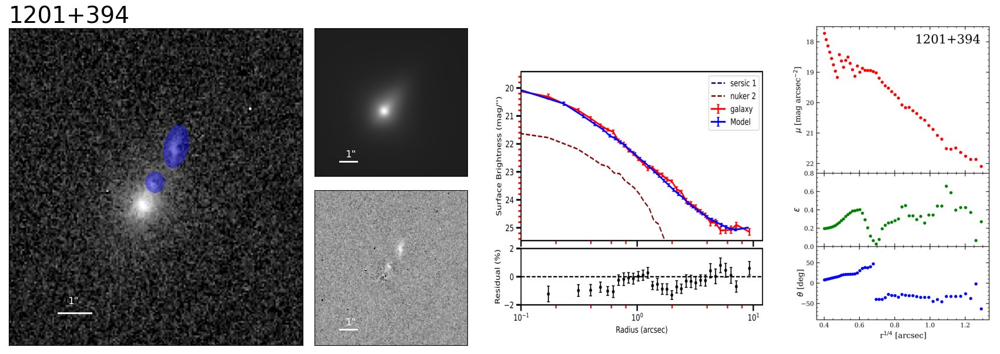

In [13]:
# 1201+394


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[0].text(0.2,0.13,'1"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[1].text(0.2,0.13,'1"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    axis_list[2].text(0.2,0.13,'1"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    plot_masked_regions(axis_list)
    
    
def plot_masked_regions(axis_list):
    
    # x, y in 'Image' co-ordinates
    axis_list[0].plot([40,60], [28,28], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([40,60], [28,28], lw=2, color='w')
    axis_list[2].plot([40,60], [28,28], lw=2, color='w')
    
    patches = []
    
    ellipse = mpatches.Ellipse((112,121), 15, 25, angle=345)
    patches.append(ellipse)
    
    circle1 = mpatches.Circle((99, 101), 6)
    patches.append(circle1)
    
    collection = PatchCollection(patches, facecolor='blue', alpha=0.4)
    axis_list[0].add_collection(collection)
    

norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=-10, vmax=400) 
norm[1] = ImageNormalize(stretch=AsinhStretch(), vmin=-10, vmax=400)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-55, vmax=200)

x1 = 10
y1 = 10
x2 = 189
y2 = 187

axes = plot(name[5])
plot_galfit_images(source[5], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[5], axes)

plt.savefig(dirname1+name[5]+'_fit.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/optical/1203+645/1203+645_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (350, 320)   float32   
  1                1 ImageHDU       456   (350, 320)   float32   
  2                1 ImageHDU        50   (350, 320)   float32   
  3                1 ImageHDU         6   (350, 320)   float32   


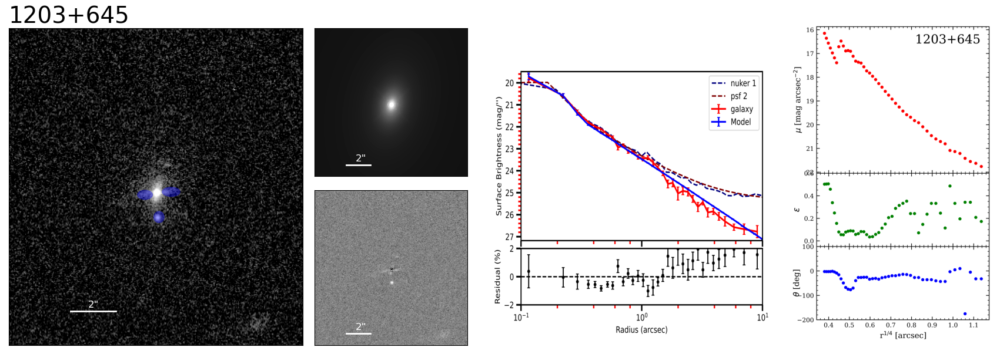

In [14]:
# 1203+645


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[0].text(0.27,0.12,'2"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[1].text(0.27,0.1,'2"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    axis_list[2].text(0.27,0.1,'2"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    plot_masked_regions(axis_list)
    
    
def plot_masked_regions(axis_list):
    
    # x, y in 'Image' co-ordinates
    axis_list[0].plot([91,140], [38,38], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([91,140], [28,28], lw=2, color='w')
    axis_list[2].plot([91,140], [28,28], lw=2, color='w')
    
    patches = []
    
    ellipse1 = mpatches.Ellipse((171,153), 17, 10, angle=0)
    patches.append(ellipse1)
    
    ellipse2 = mpatches.Ellipse((199,156), 20, 10, angle=0)
    patches.append(ellipse2)
    
    circle = mpatches.Circle((186,131), 6)
    patches.append(circle)
    
    collection = PatchCollection(patches, facecolor='blue', alpha=0.4)
    axis_list[0].add_collection(collection)
    

norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=200) 
norm[1] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=100)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-40, vmax=200)

x1 = 25
y1 = 4
x2 = 340
y2 = 318

axes = plot(name[6])
plot_galfit_images(source[6], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[6], axes)

plt.savefig(dirname1+name[6]+'_fit.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/optical/1221-423/1221-423_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (490, 390)   float32   
  1                1 ImageHDU       400   (490, 390)   float32   
  2                1 ImageHDU        60   (490, 390)   float32   
  3                1 ImageHDU         6   (490, 390)   float32   


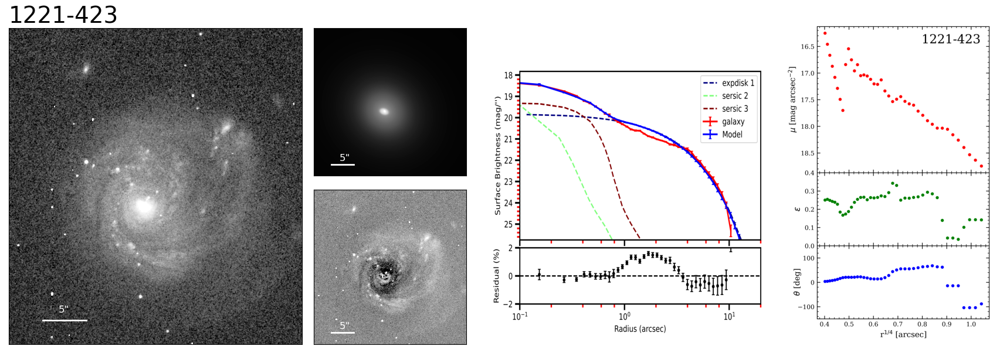

In [15]:
#1221-423


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[0].text(0.17,0.1,'5"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[1].text(0.17,0.1,'5"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    axis_list[2].text(0.17,0.1,'5"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    plot_masked_regions(axis_list)
    
    
def plot_masked_regions(axis_list):
    
    # x, y in 'Image' co-ordinates
    axis_list[0].plot([98,150], [32,32], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([98,150], [32,32], lw=2, color='w')
    axis_list[2].plot([98,150], [32,32], lw=2, color='w')
    

norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=-20, vmax=400) 
norm[1] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=970)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-50, vmax=200)


x1 = 57
y1 = 3
x2 = 410
y2 = 386

axes = plot(name[7])
plot_galfit_images(source[7], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[7], axes)

plt.savefig(dirname1+name[7]+'_fit.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/optical/1445+410/1445+410_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (145, 121)   float32   
  1                1 ImageHDU       392   (145, 121)   float32   
  2                1 ImageHDU        59   (145, 121)   float32   
  3                1 ImageHDU         6   (145, 121)   float32   


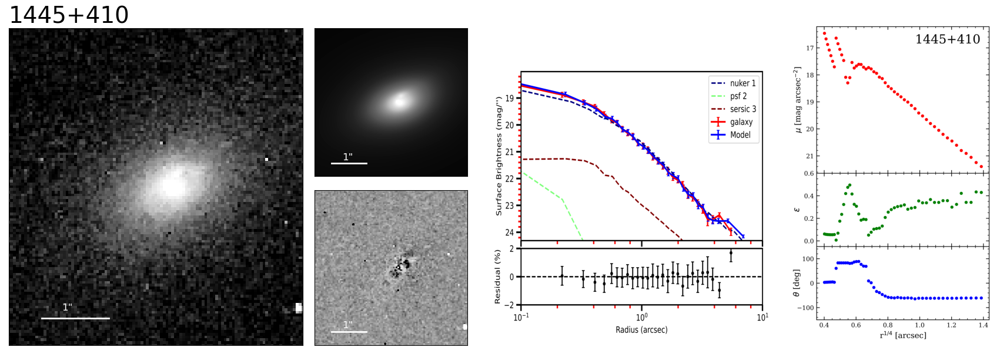

In [16]:
#1445+410


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[0].text(0.18,0.11,'1"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[1].text(0.18,0.11,'1"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    axis_list[2].text(0.18,0.11,'1"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    plot_masked_regions(axis_list)
    
    
def plot_masked_regions(axis_list):
    
    # x, y in 'Image' co-ordinates
    axis_list[0].plot([32,56], [14,14], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([32,56], [14,14], lw=2, color='w')
    axis_list[2].plot([32,56], [14,14], lw=2, color='w')
    

norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=400) 
norm[1] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=600)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-40, vmax=150)


x1 = 20
y1 = 4
x2 = 126
y2 = 120

axes = plot(name[8])
plot_galfit_images(source[8], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[8], axes)

plt.savefig(dirname1+name[8]+'_fit.pdf', dpi=1000, facecolor='w', bbox_inches='tight')

In [ ]:
#         UV band

In [3]:
dirname1 = '/Users/orion/phd_research/CSS2/galfit/uv/' 
dirname2 = '/Users/orion/phd_research/CSS2/ap_phot_new/plots/'

sources = {'1025+390': 'f336w',  '1037+30': 'f225w', '1128+455': 'f336w', 
            '1201+394': 'f336w', '1203+645': 'f336w', '1221-423': 'f336w'}

name = []
gal_mod_file = []
source = np.zeros(9, dtype=object)    #initializes an array of non-specfic type
i=0

for value in sources:
    print(value, sources[value])
    name.append(value)
    gal_mod_file.append(dirname1+value+'/'+value+'_finalfit.fits')
    source[i] = fits.open(gal_mod_file[i])
    i=i+1

print(gal_mod_file)

1025+390 f336w
1037+30 f225w
1128+455 f336w
1201+394 f336w
1203+645 f336w
1221-423 f336w
['/Users/orion/phd_research/CSS2/galfit/uv/1025+390/1025+390_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/uv/1037+30/1037+30_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/uv/1128+455/1128+455_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/uv/1201+394/1201+394_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/uv/1203+645/1203+645_finalfit.fits', '/Users/orion/phd_research/CSS2/galfit/uv/1221-423/1221-423_finalfit.fits']


In [4]:
def plot(s):

    fig = plt.figure(figsize=(20,12))

    #dimensions [left, bottom, width, height] in fractions of figure width and height
    ax1 = fig.add_axes([0.05, 0.2, 0.25, 0.45])
    ax1.set_title(s, fontsize=28, loc = 'left')
    ax2 = fig.add_axes([0.31, 0.44, 0.13, 0.21])
    ax3 = fig.add_axes([0.31, 0.2, 0.13, 0.22])
    ax4 = fig.add_axes([0.41, 0.21, 0.35, 0.43]) 
    ax5 = fig.add_axes([0.65, 0.20, 0.30, 0.46])    
    
    axis_list = fig.get_axes()      #get_axes() produces a list
        
    for i in range(3):
        format_axis_galfit(axis_list[i])
    
    format_axis(fig.get_axes()[3])
    format_axis(fig.get_axes()[4])
    
    return axis_list


def plot_isophote_data(s, axis_list):

    img = mpimg.imread(dirname1+s+'/ellipsect_plot.png')
    axis_list[3].imshow(img)
    axis_list[3].set_aspect(1.3)
 
    img = mpimg.imread(dirname2+s+'_fit2.png')
    axis_list[4].imshow(img)
    axis_list[4].set_aspect(1.0)
    

Filename: /Users/orion/phd_research/CSS2/galfit/uv/1025+390/1025+390_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (560, 458)   float32   
  1                1 ImageHDU       528   (560, 458)   float32   
  2                1 ImageHDU        43   (560, 458)   float32   
  3                1 ImageHDU         6   (560, 458)   float32   


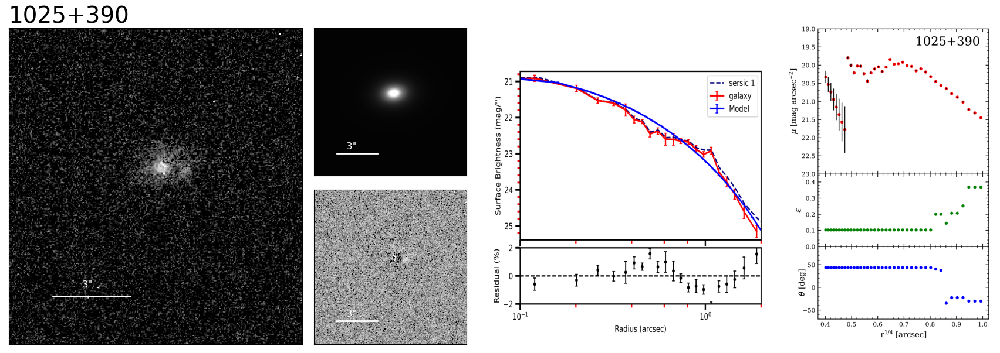

In [5]:
# 1025+390


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    
    axis_list[0].text(0.25,0.18,'3"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].text(0.21,0.18,'3"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].text(0.21,0.18,'3"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    axis_list[0].plot([181,260], [87, 87], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([181,260], [87, 87], lw=2, color='w')
    axis_list[2].plot([181,260], [87, 87], lw=2, color='w')

    
norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=200)
norm[1] = ImageNormalize(stretch=LinearStretch(), vmin=0, vmax=45)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-20, vmax=70)

# x, y in 'Image' co-ordinates
x1 = 136 
x2 = 435
y1 = 36
y2 = 370

axes = plot(name[0])
plot_galfit_images(source[0], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[0], axes)

plt.savefig(dirname1+name[0]+'_fit_uv.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/uv/1037+30/1037+30_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (135, 125)   float32   
  1                1 ImageHDU       386   (135, 125)   float32   
  2                1 ImageHDU        50   (135, 125)   float32   
  3                1 ImageHDU         6   (135, 125)   float32   


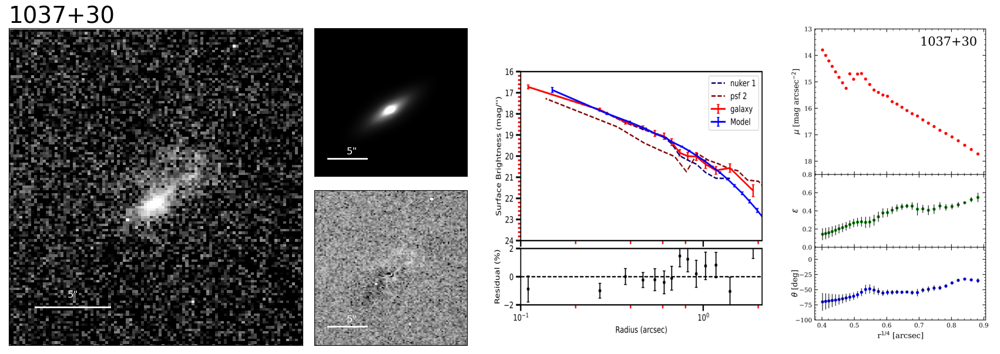

In [6]:
# 1037+30


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    
    axis_list[0].text(0.20,0.15,'5"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].text(0.21,0.15,'5"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].text(0.21,0.15,'5"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    axis_list[0].plot([30,55], [16, 16], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([30,55], [16, 16], lw=2, color='w')
    axis_list[2].plot([30,55], [16, 16], lw=2, color='w')

    
norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=-10, vmax=550)
norm[1] = ImageNormalize(stretch=LinearStretch(), vmin=0, vmax=300)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-100, vmax=400)

# x, y in 'Image' co-ordinates
x1 = 21 
x2 = 120
y1 = 1
y2 = 125

axes = plot(name[1])
plot_galfit_images(source[1], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[1], axes)

plt.savefig(dirname1+name[1]+'_fit_uv.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/uv/1128+455/1128+455_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (427, 389)   float32   
  1                1 ImageHDU       534   (427, 389)   float32   
  2                1 ImageHDU        43   (427, 389)   float32   
  3                1 ImageHDU         6   (427, 389)   float32   


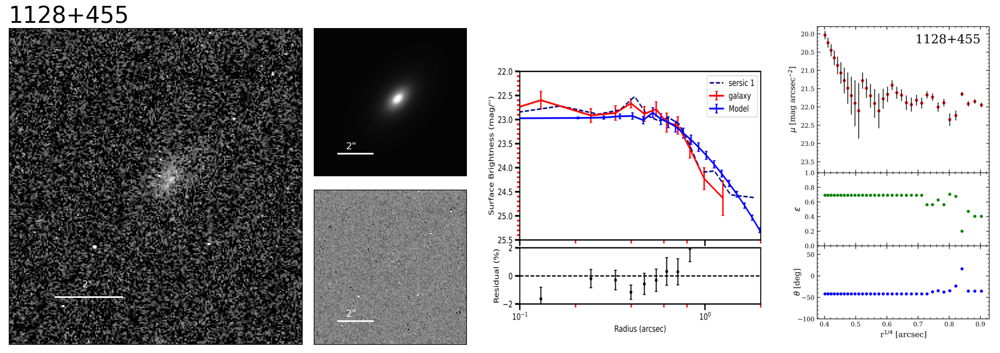

In [7]:
# 1128+455


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    
    axis_list[0].text(0.25,0.18,'2"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].text(0.21,0.18,'2"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].text(0.21,0.18,'2"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    axis_list[0].plot([135, 185], [95, 95], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([135, 185], [95, 95], lw=2, color='w')
    axis_list[2].plot([135, 185], [95, 95], lw=2, color='w')

    
norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=-5, vmax=150)
norm[1] = ImageNormalize(stretch=LinearStretch(), vmin=0, vmax=30)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-40, vmax=200)

# x, y in 'Image' co-ordinates
x1 = 100
x2 = 320
y1 = 55
y2 = 320

axes = plot(name[2])
plot_galfit_images(source[2], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[2], axes)

plt.savefig(dirname1+name[2]+'_fit_uv.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/uv/1201+394/1201+394_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (344, 320)   float32   
  1                1 ImageHDU       543   (344, 320)   float32   
  2                1 ImageHDU        43   (344, 320)   float32   
  3                1 ImageHDU         6   (344, 320)   float32   


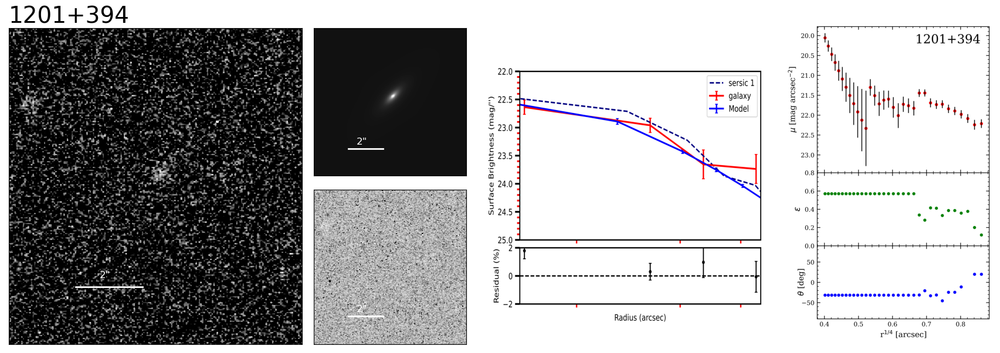

In [8]:
# 1201+394


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    
    axis_list[0].text(0.31,0.21,'2"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].text(0.28,0.21,'2"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].text(0.28,0.21,'2"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    axis_list[0].plot([121, 162], [90, 90], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([121, 162], [90, 90], lw=2, color='w')
    axis_list[2].plot([121, 162], [90, 90], lw=2, color='w')

    
norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=5, vmax=120)
norm[1] = ImageNormalize(stretch=LinearStretch(), vmin=0, vmax=45)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-40, vmax=100)

# x, y in 'Image' co-ordinates
x1 = 80
x2 = 260
y1 = 50
y2 = 270

axes = plot(name[3])
plot_galfit_images(source[3], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[3], axes)

plt.savefig(dirname1+name[3]+'_fit_uv.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/uv/1203+645/1203+645_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (320, 296)   float32   
  1                1 ImageHDU       534   (320, 296)   float32   
  2                1 ImageHDU        60   (320, 296)   float32   
  3                1 ImageHDU         6   (320, 296)   float32   


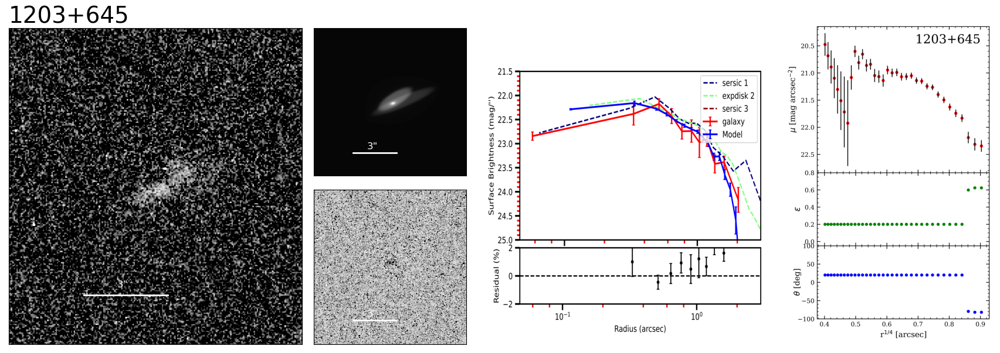

In [9]:
# 1203+645


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    
    axis_list[0].text(0.37,0.18,'3"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].text(0.35,0.18,'3"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].text(0.35,0.18,'3"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    axis_list[0].plot([114, 174], [60, 60], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([114, 174], [60, 60], lw=2, color='w')
    axis_list[2].plot([114, 174], [60, 60], lw=2, color='w')

    
norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=0, vmax=120)
norm[1] = ImageNormalize(stretch=LinearStretch(), vmin=0, vmax=60)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-30, vmax=70)

# x, y in 'Image' co-ordinates
x1 = 60
x2 = 270
y1 = 25
y2 = 250

axes = plot(name[4])
plot_galfit_images(source[4], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[4], axes)

plt.savefig(dirname1+name[4]+'_fit_uv.pdf', dpi=1000, facecolor='w', bbox_inches='tight')


Filename: /Users/orion/phd_research/CSS2/galfit/uv/1221-423/1221-423_finalfit.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   (510, 478)   float32   
  1                1 ImageHDU       434   (510, 478)   float32   
  2                1 ImageHDU        43   (510, 478)   float32   
  3                1 ImageHDU         6   (510, 478)   float32   


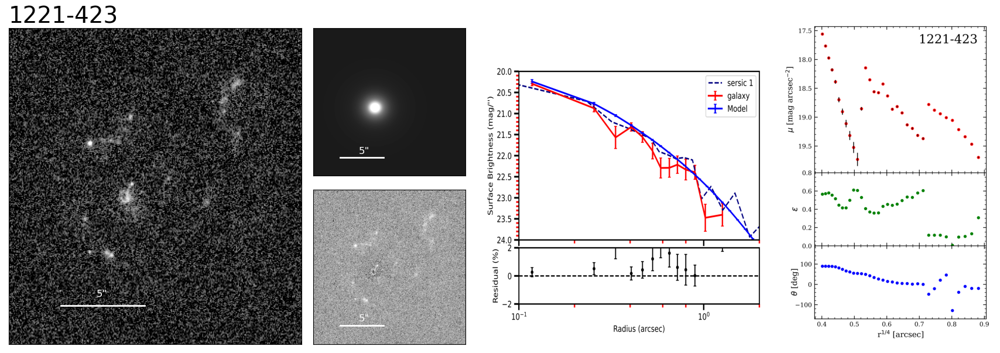

In [10]:
# 1221-423


def plot_galfit_images(file, axis_list, norm, x1,x2, y1, y2):
    
    file.info()
    galfit = file
 
    axis_list[0].imshow(galfit[1].data, origin='lower', cmap='Greys_r', norm = norm[0], aspect='auto')  
    axis_list[0].set_xlim(x1, x2)
    axis_list[0].set_ylim(y1, y2) 
    axis_list[1].imshow(galfit[2].data, origin='lower', cmap='Greys_r', norm = norm[1], aspect='auto')
    axis_list[1].set_xlim(x1, x2)
    axis_list[1].set_ylim(y1, y2)
    axis_list[2].imshow(galfit[3].data, origin='lower', cmap='Greys_r', norm = norm[2], aspect='auto')
    axis_list[2].set_xlim(x1, x2)
    axis_list[2].set_ylim(y1, y2)
    
    axis_list[0].text(0.3,0.15,'5"',fontsize=12,color='w', transform=axis_list[0].transAxes)
    axis_list[1].text(0.3,0.15,'5"',fontsize=12,color='w', transform=axis_list[1].transAxes)
    axis_list[2].text(0.3,0.15,'5"',fontsize=12,color='w', transform=axis_list[2].transAxes)
    
    axis_list[0].plot([174, 260], [118, 118], lw=2, color='w')      #[x1,x2], [y1,y2]
    axis_list[1].plot([174, 260], [118, 118], lw=2, color='w')
    axis_list[2].plot([174, 260], [118, 118], lw=2, color='w')

    
norm = list(range(3))
norm[0] = ImageNormalize(stretch=AsinhStretch(), vmin=-5, vmax=190)
norm[1] = ImageNormalize(stretch=LinearStretch(), vmin=0, vmax=20)
norm[2] = ImageNormalize(stretch=AsinhStretch(), vmin=-40, vmax=130)

# x, y in 'Image' co-ordinates
x1 = 120
x2 = 422
y1 = 80
y2 = 390

axes = plot(name[5])
plot_galfit_images(source[5], axes, norm, x1, x2, y1, y2)
plot_isophote_data(name[5], axes)

plt.savefig(dirname1+name[5]+'_fit_uv.pdf', dpi=1000, facecolor='w', bbox_inches='tight')
